In [32]:
from PIL import Image, ExifTags
import math

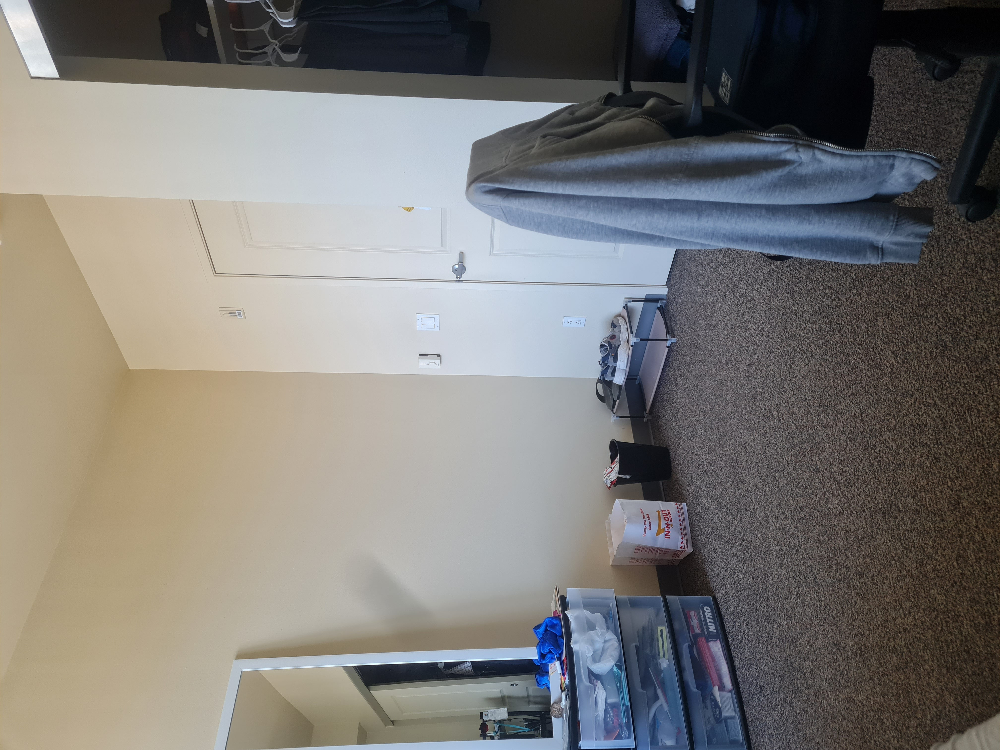

In [7]:
img = Image.open("../../mage.jpg")
display(img)

In [8]:
exif = {
    ExifTags.TAGS[k]: v
    for k, v in img._getexif().items()
    if k in ExifTags.TAGS
}

In [9]:
exif

{'ImageWidth': 4032,
 'ImageLength': 3024,
 'GPSInfo': {1: 'N',
  2: (33.0, 38.0, 43.07676),
  3: 'W',
  4: (117.0, 49.0, 48.472319)},
 'ResolutionUnit': 2,
 'ExifOffset': 238,
 'Make': 'samsung',
 'Model': 'SM-G780F',
 'Software': 'G780FXXSGFXD1',
 'Orientation': 6,
 'DateTime': '2024:05:08 14:49:21',
 'YCbCrPositioning': 1,
 'XResolution': 72.0,
 'YResolution': 72.0,
 'ExifVersion': b'0220',
 'ShutterSpeedValue': 0.01,
 'ApertureValue': 1.69,
 'DateTimeOriginal': '2024:05:08 14:49:21',
 'DateTimeDigitized': '2024:05:08 14:49:21',
 'BrightnessValue': 2.46,
 'ExposureBiasValue': 0.0,
 'MaxApertureValue': 1.69,
 'MeteringMode': 2,
 'Flash': 0,
 'FocalLength': 5.4,
 'ColorSpace': 1,
 'ExifImageWidth': 4032,
 'DigitalZoomRatio': 1.0,
 'FocalLengthIn35mmFilm': 26,
 'SceneCaptureType': 0,
 'OffsetTime': '-07:00',
 'OffsetTimeOriginal': '-07:00',
 'SubsecTime': '061',
 'SubsecTimeOriginal': '061',
 'SubsecTimeDigitized': '061',
 'ExifImageHeight': 3024,
 'ExposureTime': 0.01,
 'FNumber': 1.8

In [16]:
lat = {}
lat["dir"] = exif["GPSInfo"][1]
lat["val"] = exif["GPSInfo"][2]

lon = {}
lon["dir"] = exif["GPSInfo"][3]
lon["val"] = exif["GPSInfo"][4]

In [12]:
lat

{'dir': 'N', 'val': (33.0, 38.0, 43.07676)}

In [21]:
def convert_gps_to_float_lat_lon(old):
    direction = {'N': 1, 'S' : -1, 'E' : 1, 'W' : -1}    
    return (int(old["val"][0])+int(old["val"][1])/60.0+int(old["val"][2])/3600.0) * direction[old["dir"]]

In [22]:
def get_exif_tags_from_image(image):
    exif = {
    ExifTags.TAGS[k]: v
    for k, v in img._getexif().items()
    if k in ExifTags.TAGS
    }
    return exif

In [27]:
def get_lat_long_from_exif(exif_data):
    location_data = {}
    location_data["lat"] = {}
    location_data["lon"] = {}
    
    try:
        location_data["lat"]["dir"] = exif_data["GPSInfo"][1]
        location_data["lat"]["val"] = exif_data["GPSInfo"][2]
        location_data["lon"]["dir"] = exif_data["GPSInfo"][3]
        location_data["lon"]["val"] = exif_data["GPSInfo"][4]
    except KeyError as k:
        print(k)
        print("Location Data Missing")
    
    return location_data
    

In [30]:
def extract_lat_long_from_image(image_path):
    # Open Image From File Path
    try:
        image = Image.open(image_path)
    except FileNotFoundError as f:
        print(f)
    # Extract EXIF data from Image
    exif_tags = get_exif_tags_from_image(image)
    assert(exif_tags is not None)
    if(exif_tags is None):
        return
    # Get Lat and Long Data
    location_data_gps = get_lat_long_from_exif(exif_data=exif_tags)
    assert(location_data_gps is not None)
    try:
        final_coordinates = (convert_gps_to_float_lat_lon(location_data_gps["lat"]), convert_gps_to_float_lat_lon(location_data_gps["lon"]))
    except KeyError as k:
        print("key Error", k)
    return final_coordinates      

In [31]:
print(extract_lat_long_from_image("../../mage.jpg"))

(33.64527777777778, -117.83)


In [33]:
location_a = extract_lat_long_from_image("../../mage.jpg")

In [34]:
location_b = (33.63548056347061, -117.82801126982065)

In [35]:
def spherical_law_of_cosines(loc_1, loc_2):
    lat1 = loc_1[0]
    lon1 = loc_1[1]
    lat2 = loc_2[0]
    lon2 = loc_2[1]

    φ1 = lat1 * math.pi / 180
    φ2 = lat2 * math.pi / 180
    Δλ = (lon2 - lon1) * math.pi / 180
    R = 6371000  # Earth's radius in meters
    
    dist = math.acos(math.sin(φ1) * math.sin(φ2) + math.cos(φ1) * math.cos(φ2) * math.cos(Δλ)) * R
    return dist

In [36]:
print(spherical_law_of_cosines(location_a, location_b))

1104.8472673453841


In [37]:
def validate_if_image_is_from_given_location(image_path, location):
    image_location = extract_lat_long_from_image(image_path)
    distance = spherical_law_of_cosines(image_location, location)
    if(distance > 200):
        return False
    return True

In [39]:
validate_if_image_is_from_given_location("../../mage.jpg", (33.63074210680336, -117.82404623033393))

False